# Decoding Luxury Buying Behavior: Cohort Retention Analysis of a Jewelry E-Commerce (2018–2021) 

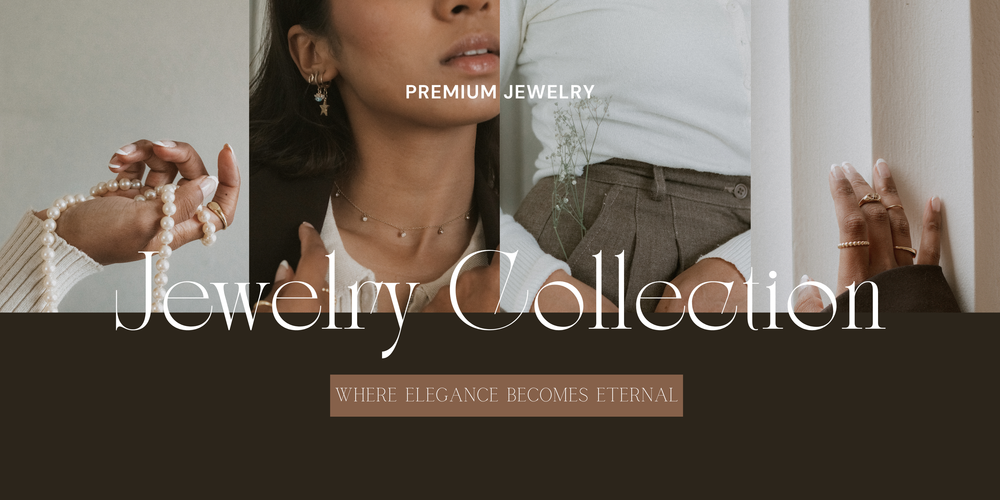

### Business Understanding
This analysis examines purchase data from a mid-sized jewelry e-commerce store (2018-2021) to decode luxury buying behaviors and customer retention patterns. The jewelry industry uniquely combines emotional purchases (gifts, self-expression) with investment-driven acquisitions, presenting opportunities to analyze both transactional value and customer loyalty. The 3-year timeframe captures critical market shifts including COVID-19 impacts, and seasonal spending habit-particularly valuable as luxury e-commerce saw decreased growth in retention.

### Problem Statement 
The jewelry e-commerce store struggles to maintain high-value customer segments. Without clear insights into which customer groups drive long-term retention, we don't know how to engage buyers who purchase across categories, marketing budgets might be misallocated, and a growing segment of high-potential customers remains underserved.

### Goal
Increase customer retention by 10% in 6 months by focusing on top-performing cohorts.

### Analytical Approach

#### 1.Find Best Customers
- Sort all customers by loyalty, measured by their repeat purchase frequency
- Focus on the top 1% for special offers

#### 2. Track Customer Loyalty Over Time
- Group customers by when they first shopped per 4 months-period
- See what percentage kept coming back each period times
- Copy what worked best 

#### 3. Refinement and Innovation (R&D Jewelry)
- Look at repeat purchase history by category
- Sustain retention excellence in our high-performing categories
- Transform low-retention categories into high-retention segments through targeted interventions

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import cufflinks as cf
cf.go_offline()

from datetime import datetime

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows',100)

In [2]:
df=pd.read_csv('jewelrywithheader.csv', parse_dates=['Order_datetime'])
df

,Order_datetime,Order_ID,Purchased_product_ID,Quantity_of_SKU_in_the_order,Category_ID,Category_alias,Brand_ID,Price_in_USD,User_ID,Product_gender_(for male/female),Color,Material,Gemstone
0,2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1,1.806829e+18,jewelry.earring,0.000000e+00,561.51,1.515916e+18,NaN,red,gold,diamond
1,2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1,1.806829e+18,NaN,NaN,212.14,1.515916e+18,NaN,yellow,gold,NaN
2,2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1,1.806829e+18,jewelry.pendant,1.000000e+00,54.66,1.515916e+18,f,white,gold,sapphire
3,2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1,1.806829e+18,jewelry.pendant,0.000000e+00,88.90,1.515916e+18,f,red,gold,diamond
4,2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1,1.806829e+18,jewelry.necklace,0.000000e+00,417.67,1.515916e+18,NaN,red,gold,amethyst
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95906,2021-12-01 09:47:37+00:00,2719016587653808559,1515966223597820877,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN
95907,2021-12-01 09:50:37+00:00,2719018098886705639,1956663830729720074,1,1.806829e+18,NaN,0.000000e+00,229.99,1.515916e+18,NaN,red,gold,NaN
95908,2021-12-01 09:52:06+00:00,2719018846999544322,1956663848219968336,1,1.806829e+18,jewelry.earring,1.000000e+00,630.00,1.515916e+18,f,white,gold,diamond
95909,2021-12-01 09:55:35+00:00,2719020596963836492,1835566854106513435,1,1.806829e+18,jewelry.earring,0.000000e+00,83.42,1.515916e+18,NaN,white,gold,fianit


In [3]:
df=df[[
    'Order_datetime',
    'Order_ID',
    'Category_alias',
    'Price_in_USD',
    'User_ID',
    'Material'
]]
df

,Order_datetime,Order_ID,Category_alias,Price_in_USD,User_ID,Material
0,2018-12-01 11:40:29+00:00,1924719191579951782,jewelry.earring,561.51,1.515916e+18,gold
1,2018-12-01 17:38:31+00:00,1924899396621697920,NaN,212.14,1.515916e+18,gold
2,2018-12-02 13:53:42+00:00,1925511016616034733,jewelry.pendant,54.66,1.515916e+18,gold
3,2018-12-02 17:44:02+00:00,1925626951238681511,jewelry.pendant,88.90,1.515916e+18,gold
4,2018-12-02 21:30:19+00:00,1925740842841014667,jewelry.necklace,417.67,1.515916e+18,gold
...,...,...,...,...,...,...
95906,2021-12-01 09:47:37+00:00,2719016587653808559,0.00,NaN,NaN,NaN
95907,2021-12-01 09:50:37+00:00,2719018098886705639,NaN,229.99,1.515916e+18,gold
95908,2021-12-01 09:52:06+00:00,2719018846999544322,jewelry.earring,630.00,1.515916e+18,gold
95909,2021-12-01 09:55:35+00:00,2719020596963836492,jewelry.earring,83.42,1.515916e+18,gold


In [4]:
df.isna().sum()

Order_datetime       0
Order_ID             0
Category_alias    9933
Price_in_USD      5352
User_ID           5352
Material          5462
dtype: int64

In [5]:
df.dropna(inplace=True)

In [6]:
df.isna().sum()

Order_datetime    0
Order_ID          0
Category_alias    0
Price_in_USD      0
User_ID           0
Material          0
dtype: int64

In [7]:
df

,Order_datetime,Order_ID,Category_alias,Price_in_USD,User_ID,Material
0,2018-12-01 11:40:29+00:00,1924719191579951782,jewelry.earring,561.51,1.515916e+18,gold
2,2018-12-02 13:53:42+00:00,1925511016616034733,jewelry.pendant,54.66,1.515916e+18,gold
3,2018-12-02 17:44:02+00:00,1925626951238681511,jewelry.pendant,88.90,1.515916e+18,gold
4,2018-12-02 21:30:19+00:00,1925740842841014667,jewelry.necklace,417.67,1.515916e+18,gold
5,2018-12-02 22:09:34+00:00,1925760595336888995,jewelry.earring,102.27,1.515916e+18,gold
...,...,...,...,...,...,...
95901,2021-12-01 09:32:35+00:00,2719009022110859402,jewelry.ring,145.62,1.515916e+18,gold
95904,2021-12-01 09:37:28+00:00,2719011482355368159,jewelry.earring,301.23,1.515916e+18,gold
95908,2021-12-01 09:52:06+00:00,2719018846999544322,jewelry.earring,630.00,1.515916e+18,gold
95909,2021-12-01 09:55:35+00:00,2719020596963836492,jewelry.earring,83.42,1.515916e+18,gold


In [8]:
df.to_csv("Final Look Data Jewelry.csv", index=False)

### Cohort Retention Jewelry

In [9]:
df = pd.read_csv('jewelrywithheader.csv', parse_dates=['Order_datetime'])
df 

,Order_datetime,Order_ID,Purchased_product_ID,Quantity_of_SKU_in_the_order,Category_ID,Category_alias,Brand_ID,Price_in_USD,User_ID,Product_gender_(for male/female),Color,Material,Gemstone
0,2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1,1.806829e+18,jewelry.earring,0.000000e+00,561.51,1.515916e+18,NaN,red,gold,diamond
1,2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1,1.806829e+18,NaN,NaN,212.14,1.515916e+18,NaN,yellow,gold,NaN
2,2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1,1.806829e+18,jewelry.pendant,1.000000e+00,54.66,1.515916e+18,f,white,gold,sapphire
3,2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1,1.806829e+18,jewelry.pendant,0.000000e+00,88.90,1.515916e+18,f,red,gold,diamond
4,2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1,1.806829e+18,jewelry.necklace,0.000000e+00,417.67,1.515916e+18,NaN,red,gold,amethyst
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95906,2021-12-01 09:47:37+00:00,2719016587653808559,1515966223597820877,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN
95907,2021-12-01 09:50:37+00:00,2719018098886705639,1956663830729720074,1,1.806829e+18,NaN,0.000000e+00,229.99,1.515916e+18,NaN,red,gold,NaN
95908,2021-12-01 09:52:06+00:00,2719018846999544322,1956663848219968336,1,1.806829e+18,jewelry.earring,1.000000e+00,630.00,1.515916e+18,f,white,gold,diamond
95909,2021-12-01 09:55:35+00:00,2719020596963836492,1835566854106513435,1,1.806829e+18,jewelry.earring,0.000000e+00,83.42,1.515916e+18,NaN,white,gold,fianit


In [10]:
#Average Repeat Order Period 
average_repeat_order_period = df
average_repeat_order_period['cohort_month']=average_repeat_order_period.groupby('User_ID')['Order_datetime'].transform('min').dt.to_period('M')

average_repeat_order_period['current_transaction_month']=average_repeat_order_period['Order_datetime'].dt.to_period('M')  
average_repeat_order_period=average_repeat_order_period[['User_ID','cohort_month','current_transaction_month']]
average_repeat_order_period

,User_ID,cohort_month,current_transaction_month
0,1.515916e+18,2018-12,2018-12
1,1.515916e+18,2018-12,2018-12
2,1.515916e+18,2018-12,2018-12
3,1.515916e+18,2018-12,2018-12
4,1.515916e+18,2018-12,2018-12
...,...,...,...
95906,NaN,NaT,2021-12
95907,1.515916e+18,2021-12,2021-12
95908,1.515916e+18,2021-12,2021-12
95909,1.515916e+18,2021-12,2021-12


In [11]:
average_repeat_order_period.dropna(inplace=True)
average_repeat_order_period

,User_ID,cohort_month,current_transaction_month
0,1.515916e+18,2018-12,2018-12
1,1.515916e+18,2018-12,2018-12
2,1.515916e+18,2018-12,2018-12
3,1.515916e+18,2018-12,2018-12
4,1.515916e+18,2018-12,2018-12
...,...,...,...
95905,1.515916e+18,2021-12,2021-12
95907,1.515916e+18,2021-12,2021-12
95908,1.515916e+18,2021-12,2021-12
95909,1.515916e+18,2021-12,2021-12


In [12]:
#Hitung period distance untuk average_repeat_order_period
average_repeat_order_period['period_distance'] = (
    (average_repeat_order_period['current_transaction_month'].dt.year - average_repeat_order_period['cohort_month'].dt.year) * 12 +
    (average_repeat_order_period['current_transaction_month'].dt.month - average_repeat_order_period['cohort_month'].dt.month)
)
average_repeat_order_period

,User_ID,cohort_month,current_transaction_month,period_distance
0,1.515916e+18,2018-12,2018-12,0
1,1.515916e+18,2018-12,2018-12,0
2,1.515916e+18,2018-12,2018-12,0
3,1.515916e+18,2018-12,2018-12,0
4,1.515916e+18,2018-12,2018-12,0
...,...,...,...,...
95905,1.515916e+18,2021-12,2021-12,0
95907,1.515916e+18,2021-12,2021-12,0
95908,1.515916e+18,2021-12,2021-12,0
95909,1.515916e+18,2021-12,2021-12,0


In [13]:
# drop period distance = 0
average_repeat_order_period=average_repeat_order_period[average_repeat_order_period['period_distance']!=0]
average_repeat_order_period

,User_ID,cohort_month,current_transaction_month,period_distance
122,1.515916e+18,2018-12,2019-01,1
125,1.515916e+18,2018-12,2019-01,1
126,1.515916e+18,2018-12,2019-01,1
135,1.325156e+18,2018-12,2019-01,1
136,1.325156e+18,2018-12,2019-01,1
...,...,...,...,...
95875,1.515916e+18,2021-11,2021-12,1
95877,1.515916e+18,2021-11,2021-12,1
95889,1.515916e+18,2021-10,2021-12,2
95900,1.515916e+18,2021-11,2021-12,1


In [14]:
# define distance between trx 1 to trx 2
average_repeat_order_period['period_distance_first_second_trx']=average_repeat_order_period.groupby('User_ID')['period_distance'].transform('min')
average_repeat_order_period

,User_ID,cohort_month,current_transaction_month,period_distance,period_distance_first_second_trx
122,1.515916e+18,2018-12,2019-01,1,1
125,1.515916e+18,2018-12,2019-01,1,1
126,1.515916e+18,2018-12,2019-01,1,1
135,1.325156e+18,2018-12,2019-01,1,1
136,1.325156e+18,2018-12,2019-01,1,1
...,...,...,...,...,...
95875,1.515916e+18,2021-11,2021-12,1,1
95877,1.515916e+18,2021-11,2021-12,1,1
95889,1.515916e+18,2021-10,2021-12,2,1
95900,1.515916e+18,2021-11,2021-12,1,1


In [100]:
## panggil kolom customer_id, period_distance_first_second_trx
average_repeat_order_period=average_repeat_order_period[['User_ID','period_distance_first_second_trx']]
average_repeat_order_period=average_repeat_order_period.drop_duplicates()
average_repeat_order_period

,User_ID,period_distance_first_second_trx
122,1.515916e+18,1
126,1.515916e+18,1
135,1.325156e+18,1
138,1.515916e+18,1
142,1.515916e+18,1
...,...,...
95858,1.515916e+18,1
95872,1.515916e+18,24
95874,1.515916e+18,1
95900,1.515916e+18,1


In [101]:
average_repeat_order_period['period_distance_first_second_trx'].value_counts()

period_distance_first_second_trx
1     1668
2      548
3      418
4      281
5      230
6      176
7      159
8      159
12     150
9      133
11     132
10     123
13      69
14      47
17      43
15      39
18      34
16      33
20      27
19      25
23      21
22      19
21      13
24      12
25       3
27       2
30       2
32       2
28       1
33       1
31       1
Name: count, dtype: int64

In [102]:
average_repeat_order_period.describe()

,User_ID,period_distance_first_second_trx
count,4.571000e+03,4571.000000
mean,1.510290e+18,4.866550
std,3.050843e+16,5.100491
min,1.313556e+18,1.000000
25%,1.515916e+18,1.000000
50%,1.515916e+18,3.000000
75%,1.515916e+18,7.000000
max,1.554297e+18,33.000000


<Axes: xlabel='period_distance_first_second_trx', ylabel='Count'>

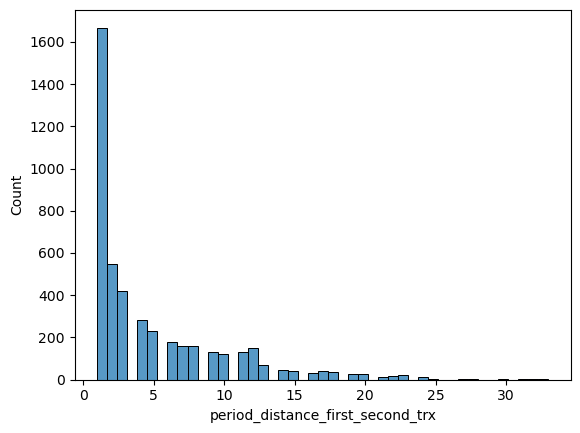

In [103]:
sns.histplot(average_repeat_order_period['period_distance_first_second_trx'])

### Cohort Customer Retention Analysis

In [104]:
# Step 1 : Define Cohort Period
df['cohort_month']=df.groupby('User_ID')['Order_datetime'].transform('min').dt.to_period('M')
df

,Order_datetime,Order_ID,Purchased_product_ID,Quantity_of_SKU_in_the_order,Category_ID,Category_alias,Brand_ID,Price_in_USD,User_ID,Product_gender_(for male/female),Color,Material,Gemstone,cohort_month
0,2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1,1.806829e+18,jewelry.earring,0.000000e+00,561.51,1.515916e+18,NaN,red,gold,diamond,2018-12
1,2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1,1.806829e+18,NaN,NaN,212.14,1.515916e+18,NaN,yellow,gold,NaN,2018-12
2,2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1,1.806829e+18,jewelry.pendant,1.000000e+00,54.66,1.515916e+18,f,white,gold,sapphire,2018-12
3,2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1,1.806829e+18,jewelry.pendant,0.000000e+00,88.90,1.515916e+18,f,red,gold,diamond,2018-12
4,2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1,1.806829e+18,jewelry.necklace,0.000000e+00,417.67,1.515916e+18,NaN,red,gold,amethyst,2018-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95906,2021-12-01 09:47:37+00:00,2719016587653808559,1515966223597820877,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN,NaT
95907,2021-12-01 09:50:37+00:00,2719018098886705639,1956663830729720074,1,1.806829e+18,NaN,0.000000e+00,229.99,1.515916e+18,NaN,red,gold,NaN,2021-12
95908,2021-12-01 09:52:06+00:00,2719018846999544322,1956663848219968336,1,1.806829e+18,jewelry.earring,1.000000e+00,630.00,1.515916e+18,f,white,gold,diamond,2021-12
95909,2021-12-01 09:55:35+00:00,2719020596963836492,1835566854106513435,1,1.806829e+18,jewelry.earring,0.000000e+00,83.42,1.515916e+18,NaN,white,gold,fianit,2021-12


In [106]:
exclude_periods = [
    pd.Period('2021-12'),
    pd.Period('2021-11'),
    pd.Period('2021-10'),
    pd.Period('2021-09'),
    pd.Period('2018-12')
]

# Drop baris jika nilai ada di exclude_periods 
df = df[~df['cohort_month'].isin(exclude_periods)]
df

,Order_datetime,Order_ID,Purchased_product_ID,Quantity_of_SKU_in_the_order,Category_ID,Category_alias,Brand_ID,Price_in_USD,User_ID,Product_gender_(for male/female),Color,Material,Gemstone,cohort_month
123,2019-01-03 13:39:43+00:00,1948696803582935276,1806829189156831241,1,1.806829e+18,jewelry.ring,NaN,1199.96,1.515916e+18,f,yellow,gold,diamond,2019-01
124,2019-01-04 10:12:30+00:00,1949317289035695031,1533189397292253673,1,1.806829e+18,electronics.clocks,6.000000e+00,177.40,1.515916e+18,f,NaN,silver,NaN,2019-01
127,2019-01-05 13:43:34+00:00,1950148297813394255,1839880235907023163,1,1.806829e+18,jewelry.earring,0.000000e+00,184.79,1.515916e+18,NaN,white,gold,topaz,2019-01
128,2019-01-05 13:49:52+00:00,1950151468229067637,1836825742751564764,1,1.806829e+18,jewelry.earring,0.000000e+00,2171.10,1.313715e+18,NaN,yellow,gold,topaz,2019-01
129,2019-01-06 08:09:05+00:00,1950704715977195970,1857305206627237989,1,1.806829e+18,jewelry.pendant,1.000000e+00,35.84,1.515916e+18,f,red,gold,NaN,2019-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95891,2021-12-01 08:58:49+00:00,2718992028972089719,1515966223638498936,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN,NaT
95892,2021-12-01 09:05:55+00:00,2718995597712425499,1515966223677246857,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN,NaT
95894,2021-12-01 09:14:01+00:00,2718999678082351855,1536902230743974482,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN,NaT
95902,2021-12-01 09:33:22+00:00,2719009418078322840,1465165964994675113,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN,NaT


In [107]:
# Step 2 : Define current transaction period
df['current_transaction_month']=df['Order_datetime'].dt.to_period('M') 

# Define current_period
df=df[['User_ID','cohort_month','current_transaction_month']]

# Drop duplikat
df.drop_duplicates(inplace=True) 
df.sort_values(by='User_ID')

,User_ID,cohort_month,current_transaction_month
19899,1.313554e+18,2020-06,2020-06
5187,1.313556e+18,2019-08,2019-08
81319,1.313556e+18,2019-08,2021-10
21867,1.313556e+18,2019-08,2020-07
18146,1.313566e+18,2019-05,2020-04
...,...,...,...
67740,NaN,NaT,2021-08
75340,NaN,NaT,2021-09
80737,NaN,NaT,2021-10
85308,NaN,NaT,2021-11


In [108]:
exclude_periods = [
    pd.Period('2021-12'),
    pd.Period('2021-11'),
    pd.Period('2021-10'),
    pd.Period('2021-09'),
    pd.Period('2018-12')
]

# Drop baris jika nilai ada di exclude_periods 
df = df[~df['current_transaction_month'].isin(exclude_periods)]
df

,User_ID,cohort_month,current_transaction_month
123,1.515916e+18,2019-01,2019-01
124,1.515916e+18,2019-01,2019-01
127,1.515916e+18,2019-01,2019-01
128,1.313715e+18,2019-01,2019-01
129,1.515916e+18,2019-01,2019-01
...,...,...,...
75326,1.515916e+18,2021-08,2021-08
75327,1.515916e+18,2021-08,2021-08
75330,1.515916e+18,2021-08,2021-08
75333,1.515916e+18,2021-08,2021-08


In [109]:
# Drop cells NaN 
df = df.dropna()
df

,User_ID,cohort_month,current_transaction_month
123,1.515916e+18,2019-01,2019-01
124,1.515916e+18,2019-01,2019-01
127,1.515916e+18,2019-01,2019-01
128,1.313715e+18,2019-01,2019-01
129,1.515916e+18,2019-01,2019-01
...,...,...,...
75326,1.515916e+18,2021-08,2021-08
75327,1.515916e+18,2021-08,2021-08
75330,1.515916e+18,2021-08,2021-08
75333,1.515916e+18,2021-08,2021-08


In [110]:
df.isna().sum()

User_ID                      0
cohort_month                 0
current_transaction_month    0
dtype: int64

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32419 entries, 123 to 75334
Data columns (total 3 columns):
 #   Column                     Non-Null Count  Dtype    
---  ------                     --------------  -----    
 0   User_ID                    32419 non-null  float64  
 1   cohort_month               32419 non-null  period[M]
 2   current_transaction_month  32419 non-null  period[M]
dtypes: float64(1), period[M](2)
memory usage: 1013.1 KB


In [112]:
# For custom 4-month periods
# df['cohort_4months'] = abs(round((
#     (df['cohort_month'].dt.year) * 12 + df['cohort_month'].dt.month -
#     ((2019*12) + 1)
# )/4))
# df
# Ensure columns are strings (optional, but safe)
df['cohort_month'] = df['cohort_month'].astype(str)
df['current_transaction_month'] = df['current_transaction_month'].astype(str)

def convert_to_4month_period(date_str):
    # Split into year and month (e.g., "2019-01" → ["2019", "01"])
    parts = date_str.split('-')
    if len(parts) != 2:  # Skip malformed entries
        return date_str
    
    year, month = parts
    
    # Compare month as a string without converting to integer
    if month in {'01', '02', '03', '04'}:
        return f"{year}-C1"
    elif month in {'05', '06', '07', '08'}:
        return f"{year}-C2"
    elif month in {'09', '10', '11', '12'}:
        return f"{year}-C3"
    else:
        return date_str  # Fallback for unexpected values

# Apply the function
# Convert User_ID from scientific notation to full integer string
df['User_ID'] = df['User_ID'].apply(lambda x: f"{int(x):.0f}")
df['cohort_month'] = df['cohort_month'].apply(convert_to_4month_period)
df['current_transaction_month'] = df['current_transaction_month'].apply(convert_to_4month_period)
df = df.drop_duplicates()
df

,User_ID,cohort_month,current_transaction_month
123,1515915625086525696,2019-C1,2019-C1
124,1515915625221699072,2019-C1,2019-C1
127,1515915625160166912,2019-C1,2019-C1
128,1313714743692755712,2019-C1,2019-C1
129,1515915625192894720,2019-C1,2019-C1
...,...,...,...
75326,1515915625622349056,2021-C2,2021-C2
75327,1515915625677966848,2021-C2,2021-C2
75330,1515915625677967872,2021-C2,2021-C2
75333,1515915625677973248,2021-C2,2021-C2


In [113]:
# Step 3 : Agregasi (count)
cohort_retention=df.groupby(['cohort_month','current_transaction_month'])['User_ID'].count().reset_index().rename(columns={'User_ID':'count_user'})
cohort_retention

,cohort_month,current_transaction_month,count_user
0,2019-C1,2019-C1,758
1,2019-C1,2019-C2,168
2,2019-C1,2019-C3,219
3,2019-C1,2020-C1,185
4,2019-C1,2020-C2,125
5,2019-C1,2020-C3,171
6,2019-C1,2021-C1,126
7,2019-C1,2021-C2,99
8,2019-C2,2019-C2,702
9,2019-C2,2019-C3,190


In [114]:
#Step 4 : Define period distance 
def calculate_period_distance(row):
    # Split cohort and current periods into year and quarter
    cohort_year, cohort_q = row['cohort_month'].split('-')
    current_year, current_q = row['current_transaction_month'].split('-')
    
    # Convert to numerical values (e.g., "C1" -> 1, "C2" -> 2, "C3" -> 3)
    cohort_num = int(cohort_q[1])  # Extract the number after "C"
    current_num = int(current_q[1])
    
    # Calculate total periods difference
    return (int(current_year) - int(cohort_year)) * 3 + (current_num - cohort_num)

# Apply the function to calculate period distance
cohort_retention['period_distance'] = cohort_retention.apply(calculate_period_distance, axis=1)
cohort_retention

,cohort_month,current_transaction_month,count_user,period_distance
0,2019-C1,2019-C1,758,0
1,2019-C1,2019-C2,168,1
2,2019-C1,2019-C3,219,2
3,2019-C1,2020-C1,185,3
4,2019-C1,2020-C2,125,4
5,2019-C1,2020-C3,171,5
6,2019-C1,2021-C1,126,6
7,2019-C1,2021-C2,99,7
8,2019-C2,2019-C2,702,0
9,2019-C2,2019-C3,190,1


In [115]:
cohort_total = cohort_retention[cohort_retention['period_distance'] == 0][['cohort_month','count_user']]
cohort_total.rename(columns={'count_user' : 'total_user'},inplace=True)
cohort_retention = pd.merge(cohort_retention, cohort_total, on='cohort_month',how='left')
cohort_retention['percentage'] = (cohort_retention['count_user']/ cohort_retention['total_user'])*100
cohort_retention

,cohort_month,current_transaction_month,count_user,period_distance,total_user,percentage
0,2019-C1,2019-C1,758,0,758,100.000000
1,2019-C1,2019-C2,168,1,758,22.163588
2,2019-C1,2019-C3,219,2,758,28.891821
3,2019-C1,2020-C1,185,3,758,24.406332
4,2019-C1,2020-C2,125,4,758,16.490765
5,2019-C1,2020-C3,171,5,758,22.559367
6,2019-C1,2021-C1,126,6,758,16.622691
7,2019-C1,2021-C2,99,7,758,13.060686
8,2019-C2,2019-C2,702,0,702,100.000000
9,2019-C2,2019-C3,190,1,702,27.065527


In [116]:
cohort_retention.to_csv("Final Look Banget Cohort Retention.csv", index=False)

In [117]:
# Step 5 : Pivot tabel
cohort_retention_pivot=cohort_retention.pivot_table(index='cohort_month',columns='period_distance',values='count_user')
cohort_retention_pivot

period_distance,0,1,2,3,4,5,6,7
cohort_month,,,,,,,,
2019-C1,758.0,168.0,219.0,185.0,125.0,171.0,126.0,99.0
2019-C2,702.0,190.0,140.0,97.0,138.0,85.0,61.0,NaN
2019-C3,1199.0,267.0,138.0,265.0,125.0,103.0,NaN,NaN
2020-C1,1279.0,169.0,227.0,154.0,108.0,NaN,NaN,NaN
2020-C2,1256.0,241.0,138.0,112.0,NaN,NaN,NaN,NaN
2020-C3,5284.0,388.0,200.0,NaN,NaN,NaN,NaN,NaN
2021-C1,6927.0,316.0,NaN,NaN,NaN,NaN,NaN,NaN
2021-C2,6621.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [118]:
# Step 6 : Convert to percentage
cohort_retention_final=cohort_retention_pivot.divide(cohort_retention_pivot.iloc[:,0],axis=0)
cohort_retention_final

period_distance,0,1,2,3,4,5,6,7
cohort_month,,,,,,,,
2019-C1,1.0,0.221636,0.288918,0.244063,0.164908,0.225594,0.166227,0.130607
2019-C2,1.0,0.270655,0.199430,0.138177,0.196581,0.121083,0.086895,NaN
2019-C3,1.0,0.222686,0.115096,0.221018,0.104254,0.085905,NaN,NaN
2020-C1,1.0,0.132134,0.177482,0.120407,0.084441,NaN,NaN,NaN
2020-C2,1.0,0.191879,0.109873,0.089172,NaN,NaN,NaN,NaN
2020-C3,1.0,0.073429,0.037850,NaN,NaN,NaN,NaN,NaN
2021-C1,1.0,0.045619,NaN,NaN,NaN,NaN,NaN,NaN
2021-C2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Retention

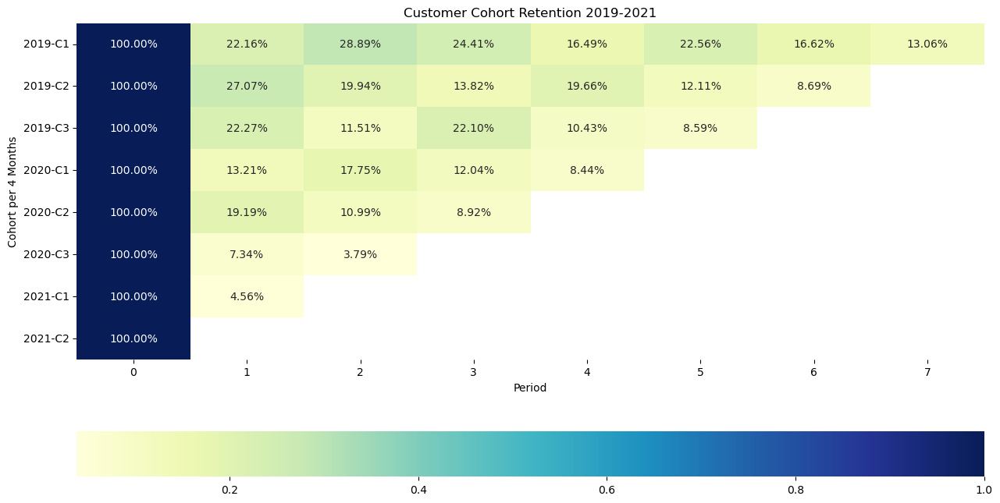

In [119]:
# Cohort Retention Visualization
plt.figure(figsize=(15,8))
sns.heatmap(data=cohort_retention_final,annot=True,fmt='.2%'
            ,cbar_kws={'orientation':'horizontal'},cmap='YlGnBu')
plt.title('Customer Cohort Retention 2019-2021')
plt.xlabel('Period')
plt.ylabel('Cohort per 4 Months')
plt.show()

In [120]:
cohort_retention_pivot.to_csv("Final Look Cohort Retention Pivot.csv", index=False)

### Retention

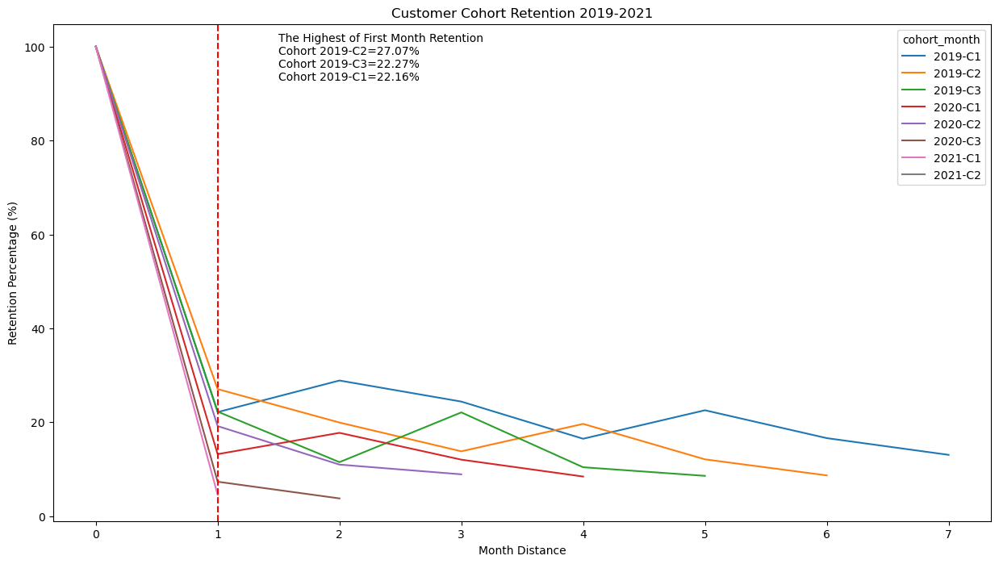

In [121]:
#Create lineplot
plt.figure(figsize=(15,8))

#Cohort lineplot
sns.lineplot(data=cohort_retention,x='period_distance',y='percentage',hue='cohort_month')

#Vertical line
plt.axvline(x=1,linestyle='--',color='red')

#Anotasi
top_3=cohort_retention[cohort_retention['period_distance']==1].sort_values(by='percentage',ascending=False).head()
top_3_name=top_3['cohort_month'].to_list()
top_3_percentage=top_3['percentage'].to_list()

#String anotasi
text=f'''
The Highest of First Month Retention
Cohort {top_3_name[0]}={0.01*top_3_percentage[0]:.2%}
Cohort {top_3_name[1]}={0.01*top_3_percentage[1]:.2%}
Cohort {top_3_name[2]}={0.01*top_3_percentage[2]:.2%}
'''

plt.text(1.5,90,text)

plt.xlabel('Month Distance')
plt.ylabel('Retention Percentage (%)')
plt.title('Customer Cohort Retention 2019-2021')
plt.show()

In [122]:
# Distribusi Customer untuk melihat outlier (EDA)
df=pd.read_csv('jewelrywithheader.csv', parse_dates=['Order_datetime'])
df

order_counts=df['User_ID'].value_counts().reset_index()
order_counts.columns=['User_ID','order_counts']
order_counts

,User_ID,order_counts
0,1.515916e+18,1068
1,1.515916e+18,696
2,1.515916e+18,540
3,1.515916e+18,509
4,1.515916e+18,480
...,...,...
30910,1.515916e+18,1
30911,1.515916e+18,1
30912,1.515916e+18,1
30913,1.515916e+18,1


In [123]:
order_counts_filter=order_counts[order_counts['order_counts']>1]
order_counts_filter

,User_ID,order_counts
0,1.515916e+18,1068
1,1.515916e+18,696
2,1.515916e+18,540
3,1.515916e+18,509
4,1.515916e+18,480
...,...,...
12241,1.515916e+18,2
12242,1.515916e+18,2
12243,1.515916e+18,2
12244,1.515916e+18,2


In [124]:
order_counts_filter['order_counts'].value_counts()

order_counts
2      6061
3      2229
4      1223
5       687
6       463
       ... 
162       1
165       1
173       1
176       1
82        1
Name: count, Length: 154, dtype: int64

In [125]:
conditions = [
    (order_counts_filter['order_counts'] >= 2) & (order_counts_filter['order_counts'] < 101),
    (order_counts_filter['order_counts'] >= 101) & (order_counts_filter['order_counts'] < 201),
    (order_counts_filter['order_counts'] >= 201) & (order_counts_filter['order_counts'] < 301),
    (order_counts_filter['order_counts'] >= 301) & (order_counts_filter['order_counts'] < 401),
    (order_counts_filter['order_counts'] >= 401) & (order_counts_filter['order_counts'] < 501),
    (order_counts_filter['order_counts'] >= 501) & (order_counts_filter['order_counts'] < 601),
    (order_counts_filter['order_counts'] >= 601) & (order_counts_filter['order_counts'] < 701),
    (order_counts_filter['order_counts'] >= 701) & (order_counts_filter['order_counts'] < 801),
    (order_counts_filter['order_counts'] >= 801) & (order_counts_filter['order_counts'] < 901),
    (order_counts_filter['order_counts'] >= 901)
]

choices = ['2-100', '101-200', '201-300','301-400','401-500','501-600','601-700','701-800','801-900','901+']

order_counts_filter['order_category'] = np.select(conditions, choices, default='Other')
order_counts_filter

,User_ID,order_counts,order_category
0,1.515916e+18,1068,901+
1,1.515916e+18,696,601-700
2,1.515916e+18,540,501-600
3,1.515916e+18,509,501-600
4,1.515916e+18,480,401-500
...,...,...,...
12241,1.515916e+18,2,2-100
12242,1.515916e+18,2,2-100
12243,1.515916e+18,2,2-100
12244,1.515916e+18,2,2-100


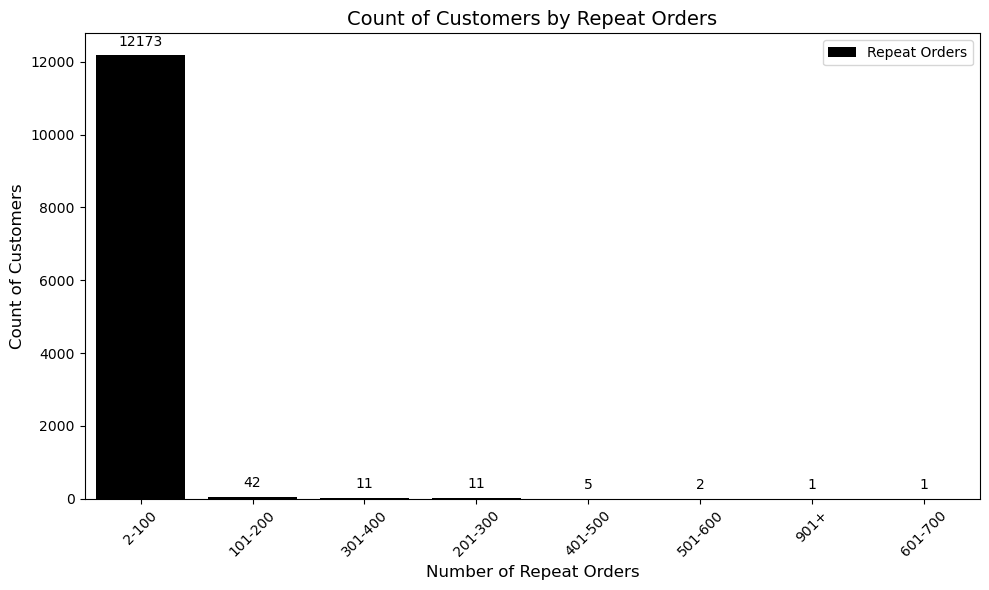

In [126]:
# Convert to categorical if needed (e.g., order counts as integers)
# order_counts_filter['order_category'] = order_counts_filter['order_category'].astype(int)

# Plot with countplot
# sns.countplot(
#     x='order_category', 
#     data=order_counts_filter, 
#     color='black', 
#     label='Repeat Orders',
# )

# plt.title('Count of Customers by Repeat Orders')
# plt.xlabel('Number of Repeat Orders')
# plt.ylabel('Count of Customers')
# plt.ylim(0, 6500)  # Set y-axis max to 3000 (adjust as needed)
# plt.legend()  # Only if 'label' is used
# plt.tight_layout()
# plt.show()

import seaborn as sns
import matplotlib.pyplot as plt

# Get category order (descending)
category_order = order_counts_filter['order_category'].value_counts().index

# Plot
plt.figure(figsize=(10, 6))
ax = sns.countplot(
    x='order_category',
    data=order_counts_filter,
    color='black',
    label='Repeat Orders',
    order=category_order
)

# Add labels
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 10),
        textcoords='offset points',
        fontsize=10
    )

# Customize
plt.title('Count of Customers by Repeat Orders', fontsize=14)
plt.xlabel('Number of Repeat Orders', fontsize=12)
plt.ylabel('Count of Customers', fontsize=12)
plt.xticks(rotation=45)  # Rotate x-labels if needed
plt.tight_layout()
plt.show()

In [127]:
df=pd.read_csv('jewelrywithheader.csv', parse_dates=['Order_datetime'])

# Hitung frekuensi transaksi per User_ID
user_transaction_counts = df['User_ID'].value_counts().reset_index()
user_transaction_counts.columns = ['User_ID', 'Jumlah_Transaksi']
user_transaction_counts['User_ID'] = user_transaction_counts['User_ID'].apply(lambda x: f"{int(x):.0f}")

# Urutkan dari yang terbanyak
top_users = user_transaction_counts.sort_values('Jumlah_Transaksi', ascending=False)

# Ambil 10 teratas + info statistik
print(f"📊 Total unik User_ID: {len(top_users)}")
print(f"🔝 Top 10 User_ID dengan transaksi terbanyak:")
display(top_users.head(10))

print(f"\n📌 Statistik:")
print(f"• Transaksi terbanyak: {top_users['Jumlah_Transaksi'].max()}x")
print(f"• Transaksi tersedikit: {top_users['Jumlah_Transaksi'].min()}x")
print(f"• Rata-rata transaksi per user: {top_users['Jumlah_Transaksi'].mean():.1f}x")

📊 Total unik User_ID: 30915
🔝 Top 10 User_ID dengan transaksi terbanyak:


,User_ID,Jumlah_Transaksi
0,1515915625245643008,1068
1,1515915625368881664,696
2,1515915625337818112,540
3,1515915625078636800,509
4,1515915625248999168,480
5,1515915625045119488,471
6,1515915625219296000,425
7,1515915625450853120,408
8,1515915625193362688,402
9,1515915625196556288,372



📌 Statistik:
• Transaksi terbanyak: 1068x
• Transaksi tersedikit: 1x
• Rata-rata transaksi per user: 2.9x


In [128]:
displaytop10 = pd.DataFrame(columns=['User_ID','Jumlah_Transaksi'],data=[['1515915625245643008','1068'],["1515915625368881664",'696'],['1515915625337818112','540'],['1515915625078636800','509'],['1515915625248999168','480'],['1515915625045119488','471'],['1515915625219296000','425'],['1515915625450853120','408'],['1515915625193362688','402'],['1515915625196556288','372']])
displaytop10

,User_ID,Jumlah_Transaksi
0,1515915625245643008,1068
1,1515915625368881664,696
2,1515915625337818112,540
3,1515915625078636800,509
4,1515915625248999168,480
5,1515915625045119488,471
6,1515915625219296000,425
7,1515915625450853120,408
8,1515915625193362688,402
9,1515915625196556288,372


In [129]:
displaytop10.to_csv("displaytop10.csv", index=False)

In [130]:
#Cohort per Category 
df=pd.read_csv('jewelrywithheader.csv', parse_dates=['Order_datetime'])
df

,Order_datetime,Order_ID,Purchased_product_ID,Quantity_of_SKU_in_the_order,Category_ID,Category_alias,Brand_ID,Price_in_USD,User_ID,Product_gender_(for male/female),Color,Material,Gemstone
0,2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1,1.806829e+18,jewelry.earring,0.000000e+00,561.51,1.515916e+18,NaN,red,gold,diamond
1,2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1,1.806829e+18,NaN,NaN,212.14,1.515916e+18,NaN,yellow,gold,NaN
2,2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1,1.806829e+18,jewelry.pendant,1.000000e+00,54.66,1.515916e+18,f,white,gold,sapphire
3,2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1,1.806829e+18,jewelry.pendant,0.000000e+00,88.90,1.515916e+18,f,red,gold,diamond
4,2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1,1.806829e+18,jewelry.necklace,0.000000e+00,417.67,1.515916e+18,NaN,red,gold,amethyst
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95906,2021-12-01 09:47:37+00:00,2719016587653808559,1515966223597820877,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN
95907,2021-12-01 09:50:37+00:00,2719018098886705639,1956663830729720074,1,1.806829e+18,NaN,0.000000e+00,229.99,1.515916e+18,NaN,red,gold,NaN
95908,2021-12-01 09:52:06+00:00,2719018846999544322,1956663848219968336,1,1.806829e+18,jewelry.earring,1.000000e+00,630.00,1.515916e+18,f,white,gold,diamond
95909,2021-12-01 09:55:35+00:00,2719020596963836492,1835566854106513435,1,1.806829e+18,jewelry.earring,0.000000e+00,83.42,1.515916e+18,NaN,white,gold,fianit


In [131]:
df=df[[
    'Order_datetime',
    'User_ID',
    'Category_alias'
]]
df

,Order_datetime,User_ID,Category_alias
0,2018-12-01 11:40:29+00:00,1.515916e+18,jewelry.earring
1,2018-12-01 17:38:31+00:00,1.515916e+18,NaN
2,2018-12-02 13:53:42+00:00,1.515916e+18,jewelry.pendant
3,2018-12-02 17:44:02+00:00,1.515916e+18,jewelry.pendant
4,2018-12-02 21:30:19+00:00,1.515916e+18,jewelry.necklace
...,...,...,...
95906,2021-12-01 09:47:37+00:00,NaN,0.00
95907,2021-12-01 09:50:37+00:00,1.515916e+18,NaN
95908,2021-12-01 09:52:06+00:00,1.515916e+18,jewelry.earring
95909,2021-12-01 09:55:35+00:00,1.515916e+18,jewelry.earring


In [132]:
df.dropna()

,Order_datetime,User_ID,Category_alias
0,2018-12-01 11:40:29+00:00,1.515916e+18,jewelry.earring
2,2018-12-02 13:53:42+00:00,1.515916e+18,jewelry.pendant
3,2018-12-02 17:44:02+00:00,1.515916e+18,jewelry.pendant
4,2018-12-02 21:30:19+00:00,1.515916e+18,jewelry.necklace
5,2018-12-02 22:09:34+00:00,1.515916e+18,jewelry.earring
...,...,...,...
95901,2021-12-01 09:32:35+00:00,1.515916e+18,jewelry.ring
95904,2021-12-01 09:37:28+00:00,1.515916e+18,jewelry.earring
95908,2021-12-01 09:52:06+00:00,1.515916e+18,jewelry.earring
95909,2021-12-01 09:55:35+00:00,1.515916e+18,jewelry.earring


In [133]:
df['Category_alias'].value_counts()

Category_alias
jewelry.earring     29052
jewelry.ring        28300
jewelry.pendant     13088
jewelry.bracelet     6188
0.00                 4392
                    ...  
626.58                  1
13.42                   1
2.88                    1
101.23                  1
253.77                  1
Name: count, Length: 218, dtype: int64

`Jewelry.earrings`

In [134]:
jewelry_earrings_data = df[df['Category_alias'] == 'jewelry.earring']
jewelry_earrings_data

,Order_datetime,User_ID,Category_alias
0,2018-12-01 11:40:29+00:00,1.515916e+18,jewelry.earring
5,2018-12-02 22:09:34+00:00,1.515916e+18,jewelry.earring
6,2018-12-02 22:09:34+00:00,1.515916e+18,jewelry.earring
7,2018-12-02 22:16:20+00:00,1.515916e+18,jewelry.earring
9,2018-12-03 09:48:34+00:00,1.515916e+18,jewelry.earring
...,...,...,...
95899,2021-12-01 09:22:17+00:00,1.515916e+18,jewelry.earring
95900,2021-12-01 09:23:52+00:00,1.515916e+18,jewelry.earring
95904,2021-12-01 09:37:28+00:00,1.515916e+18,jewelry.earring
95908,2021-12-01 09:52:06+00:00,1.515916e+18,jewelry.earring


In [135]:
#Define Cohort 
jewelry_earrings_data['cohort_month']=jewelry_earrings_data.groupby('User_ID')['Order_datetime'].transform('min').dt.to_period('M')

jewelry_earrings_data['current_transaction_month']=jewelry_earrings_data['Order_datetime'].dt.to_period('M')  
jewelry_earrings_data=jewelry_earrings_data[['User_ID','cohort_month','current_transaction_month']]
jewelry_earrings_data

,User_ID,cohort_month,current_transaction_month
0,1.515916e+18,2018-12,2018-12
5,1.515916e+18,2018-12,2018-12
6,1.515916e+18,2018-12,2018-12
7,1.515916e+18,2018-12,2018-12
9,1.515916e+18,2018-12,2018-12
...,...,...,...
95899,1.515916e+18,2021-12,2021-12
95900,1.515916e+18,2021-11,2021-12
95904,1.515916e+18,2021-12,2021-12
95908,1.515916e+18,2021-12,2021-12


In [136]:
exclude_periods = [pd.Period('2021-12'), 
    pd.Period('2021-11'), 
    pd.Period('2021-10'), 
    pd.Period('2021-09'), 
    pd.Period('2018-12')]
jewelry_earrings_data = jewelry_earrings_data[~jewelry_earrings_data['cohort_month'].isin(exclude_periods)]
jewelry_earrings_data

,User_ID,cohort_month,current_transaction_month
127,1.515916e+18,2019-01,2019-01
128,1.313715e+18,2019-01,2019-01
131,1.515916e+18,2019-01,2019-01
132,1.515916e+18,2019-01,2019-01
137,1.515916e+18,2019-01,2019-01
...,...,...,...
95784,1.515916e+18,2021-05,2021-12
95788,1.515916e+18,2021-07,2021-12
95837,1.515916e+18,2019-10,2021-12
95838,1.515916e+18,2019-10,2021-12


In [137]:
exclude_periods = [pd.Period('2021-12'), 
    pd.Period('2021-11'), 
    pd.Period('2021-10'), 
    pd.Period('2021-09'), 
    pd.Period('2018-12')]
jewelry_earrings_data = jewelry_earrings_data[~jewelry_earrings_data['current_transaction_month'].isin(exclude_periods)]
jewelry_earrings_data

,User_ID,cohort_month,current_transaction_month
127,1.515916e+18,2019-01,2019-01
128,1.313715e+18,2019-01,2019-01
131,1.515916e+18,2019-01,2019-01
132,1.515916e+18,2019-01,2019-01
137,1.515916e+18,2019-01,2019-01
...,...,...,...
75328,1.515916e+18,2021-08,2021-08
75329,1.515916e+18,2021-08,2021-08
75332,1.515916e+18,2021-08,2021-08
75333,1.515916e+18,2021-08,2021-08


In [138]:
# Ensure columns are strings (optional, but safe)
jewelry_earrings_data['cohort_month'] = jewelry_earrings_data['cohort_month'].astype(str)
jewelry_earrings_data['current_transaction_month'] = jewelry_earrings_data['current_transaction_month'].astype(str)

def jewelry_earrings_data4month(date_str):
    # Split into year and month (e.g., "2019-01" → ["2019", "01"])
    parts = date_str.split('-')
    if len(parts) != 2:  # Skip malformed entries
        return date_str
    
    year, month = parts
    
    # Compare month as a string without converting to integer
    if month in {'01', '02', '03', '04'}:
        return f"{year}-C1"
    elif month in {'05', '06', '07', '08'}:
        return f"{year}-C2"
    elif month in {'09', '10', '11', '12'}:
        return f"{year}-C3"
    else:
        return date_str  # Fallback for unexpected values

# Apply the function
# Convert User_ID from scientific notation to full integer string
jewelry_earrings_data['User_ID'] = jewelry_earrings_data['User_ID'].apply(lambda x: f"{int(x):.0f}")
jewelry_earrings_data['cohort_month'] = jewelry_earrings_data['cohort_month'].apply(convert_to_4month_period)
jewelry_earrings_data['current_transaction_month'] = jewelry_earrings_data['current_transaction_month'].apply(convert_to_4month_period)
jewelry_earrings_data = jewelry_earrings_data.drop_duplicates()
jewelry_earrings_data

,User_ID,cohort_month,current_transaction_month
127,1515915625160166912,2019-C1,2019-C1
128,1313714743692755712,2019-C1,2019-C1
131,1515915625162710528,2019-C1,2019-C1
137,1515915625160153600,2019-C1,2019-C1
141,1550612949079425536,2019-C1,2019-C1
...,...,...,...
75311,1515915625667417088,2021-C2,2021-C2
75324,1515915625675153664,2021-C2,2021-C2
75325,1515915625677965056,2021-C2,2021-C2
75327,1515915625677966848,2021-C2,2021-C2


In [139]:
# Step 3 : Agregasi (count)
cohort_retention_earrings=jewelry_earrings_data.groupby(['cohort_month','current_transaction_month'])['User_ID'].count().reset_index().rename(columns={'User_ID':'count_user'})
cohort_retention_earrings

,cohort_month,current_transaction_month,count_user
0,2019-C1,2019-C1,370
1,2019-C1,2019-C2,74
2,2019-C1,2019-C3,84
3,2019-C1,2020-C1,70
4,2019-C1,2020-C2,40
5,2019-C1,2020-C3,58
6,2019-C1,2021-C1,38
7,2019-C1,2021-C2,38
8,2019-C2,2019-C2,344
9,2019-C2,2019-C3,69


In [140]:
#Step 4 : Define period distance 
def calculate_period_distance_earrings(row):
    # Split cohort and current periods into year and quarter
    cohort_year, cohort_q = row['cohort_month'].split('-')
    current_year, current_q = row['current_transaction_month'].split('-')
    
    # Convert to numerical values (e.g., "C1" -> 1, "C2" -> 2, "C3" -> 3)
    cohort_num = int(cohort_q[1])  # Extract the number after "C"
    current_num = int(current_q[1])
    
    # Calculate total periods difference
    return (int(current_year) - int(cohort_year)) * 3 + (current_num - cohort_num)

# Apply the function to calculate period distance
cohort_retention_earrings['period_distance'] = cohort_retention_earrings.apply(calculate_period_distance, axis=1)
cohort_retention_earrings

,cohort_month,current_transaction_month,count_user,period_distance
0,2019-C1,2019-C1,370,0
1,2019-C1,2019-C2,74,1
2,2019-C1,2019-C3,84,2
3,2019-C1,2020-C1,70,3
4,2019-C1,2020-C2,40,4
5,2019-C1,2020-C3,58,5
6,2019-C1,2021-C1,38,6
7,2019-C1,2021-C2,38,7
8,2019-C2,2019-C2,344,0
9,2019-C2,2019-C3,69,1


In [141]:
cohort_total_earrings = cohort_retention_earrings[cohort_retention_earrings['period_distance'] == 0][['cohort_month','count_user']]
cohort_total_earrings.rename(columns={'count_user' : 'total_user'},inplace=True)
cohort_retention_earrings = pd.merge(cohort_retention_earrings, cohort_total_earrings, on='cohort_month',how='left')
cohort_retention_earrings['percentage'] = (cohort_retention_earrings['count_user']/ cohort_retention_earrings['total_user'])*100
cohort_retention_earrings

,cohort_month,current_transaction_month,count_user,period_distance,total_user,percentage
0,2019-C1,2019-C1,370,0,370,100.000000
1,2019-C1,2019-C2,74,1,370,20.000000
2,2019-C1,2019-C3,84,2,370,22.702703
3,2019-C1,2020-C1,70,3,370,18.918919
4,2019-C1,2020-C2,40,4,370,10.810811
5,2019-C1,2020-C3,58,5,370,15.675676
6,2019-C1,2021-C1,38,6,370,10.270270
7,2019-C1,2021-C2,38,7,370,10.270270
8,2019-C2,2019-C2,344,0,344,100.000000
9,2019-C2,2019-C3,69,1,344,20.058140


In [142]:
cohort_retention_earrings.to_csv("Final Look Cohort Retention Earrings.csv", index=False)

In [143]:
# Step 5 : Pivot tabel
cohort_retention_pivot_earrings=cohort_retention_earrings.pivot_table(index='cohort_month',columns='period_distance',values='count_user')
cohort_retention_pivot_earrings

period_distance,0,1,2,3,4,5,6,7
cohort_month,,,,,,,,
2019-C1,370.0,74.0,84.0,70.0,40.0,58.0,38.0,38.0
2019-C2,344.0,69.0,49.0,38.0,46.0,31.0,26.0,NaN
2019-C3,685.0,108.0,55.0,94.0,47.0,42.0,NaN,NaN
2020-C1,635.0,61.0,69.0,66.0,37.0,NaN,NaN,NaN
2020-C2,640.0,87.0,59.0,48.0,NaN,NaN,NaN,NaN
2020-C3,2431.0,119.0,63.0,NaN,NaN,NaN,NaN,NaN
2021-C1,2965.0,113.0,NaN,NaN,NaN,NaN,NaN,NaN
2021-C2,2890.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [144]:
# Step 6 : Convert to percentage
cohort_retention_final_earrings=cohort_retention_pivot_earrings.divide(cohort_retention_pivot_earrings.iloc[:,0],axis=0)
cohort_retention_final_earrings

period_distance,0,1,2,3,4,5,6,7
cohort_month,,,,,,,,
2019-C1,1.0,0.200000,0.227027,0.189189,0.108108,0.156757,0.102703,0.102703
2019-C2,1.0,0.200581,0.142442,0.110465,0.133721,0.090116,0.075581,NaN
2019-C3,1.0,0.157664,0.080292,0.137226,0.068613,0.061314,NaN,NaN
2020-C1,1.0,0.096063,0.108661,0.103937,0.058268,NaN,NaN,NaN
2020-C2,1.0,0.135937,0.092188,0.075000,NaN,NaN,NaN,NaN
2020-C3,1.0,0.048951,0.025915,NaN,NaN,NaN,NaN,NaN
2021-C1,1.0,0.038111,NaN,NaN,NaN,NaN,NaN,NaN
2021-C2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


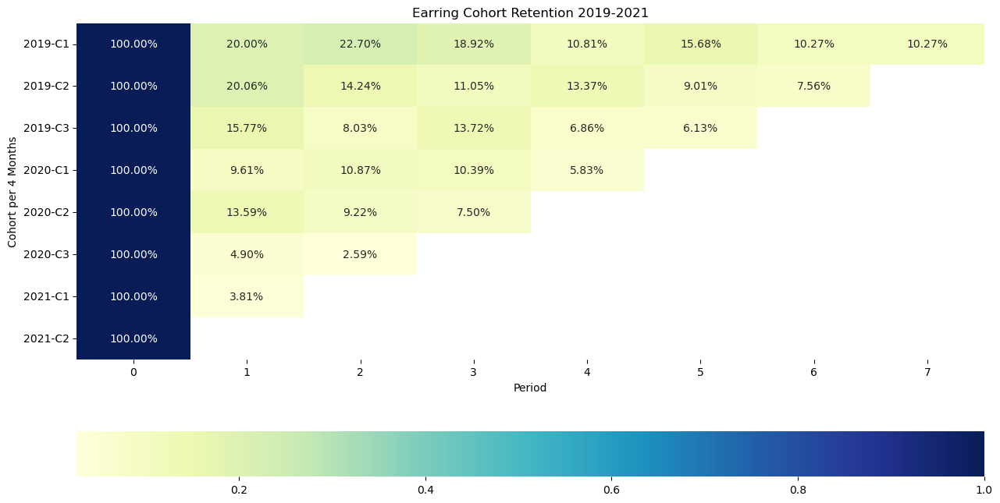

In [145]:
# Cohort Retention Visualization
plt.figure(figsize=(15,8))
sns.heatmap(data=cohort_retention_final_earrings,annot=True,fmt='.2%'
            ,cbar_kws={'orientation':'horizontal'},cmap='YlGnBu')
plt.title('Earring Cohort Retention 2019-2021')
plt.xlabel('Period')
plt.ylabel('Cohort per 4 Months')
plt.show()

In [146]:
cohort_retention_pivot_earrings.to_csv("Final Look Cohort Retention Pivot Earring.csv", index=False)

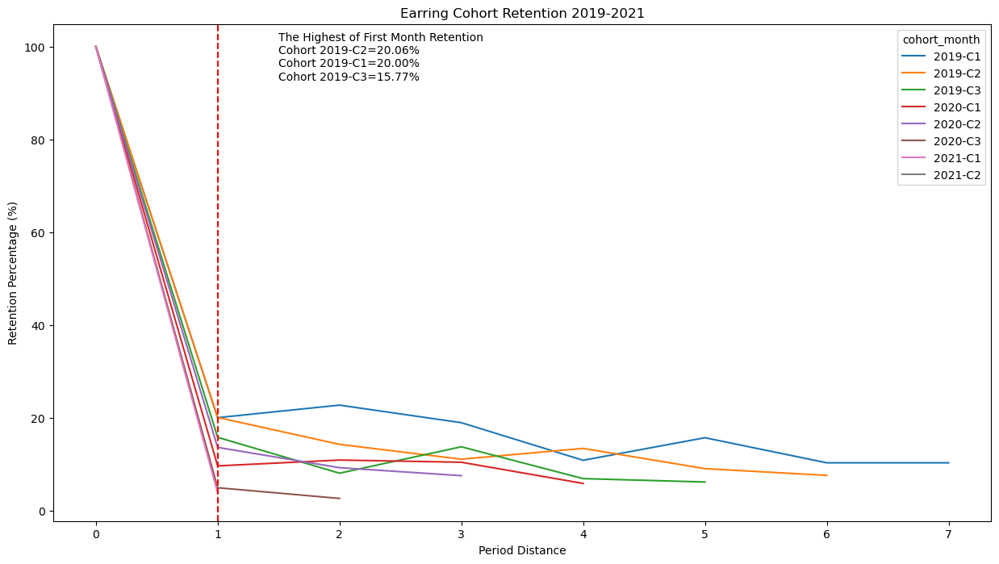

In [147]:
#Create lineplot
plt.figure(figsize=(15,8))

#Cohort lineplot
sns.lineplot(data=cohort_retention_earrings,x='period_distance',y='percentage',hue='cohort_month')

#Vertical line
plt.axvline(x=1,linestyle='--',color='red')

#Anotasi
top_3=cohort_retention_earrings[cohort_retention_earrings['period_distance']==1].sort_values(by='percentage',ascending=False).head()
top_3_name=top_3['cohort_month'].to_list()
top_3_percentage=top_3['percentage'].to_list()

#String anotasi
text=f'''
The Highest of First Month Retention
Cohort {top_3_name[0]}={0.01*top_3_percentage[0]:.2%}
Cohort {top_3_name[1]}={0.01*top_3_percentage[1]:.2%}
Cohort {top_3_name[2]}={0.01*top_3_percentage[2]:.2%}
'''

plt.text(1.5,90,text)

plt.xlabel('Period Distance')
plt.ylabel('Retention Percentage (%)')
plt.title('Earring Cohort Retention 2019-2021')
plt.show()

`Jewelry.ring`

In [175]:
jewelry_ring_data = df[df['Category_alias'] == 'jewelry.ring']
jewelry_ring_data

,Order_datetime,User_ID,Category_alias
10,2018-12-03 09:48:34+00:00,1.515916e+18,jewelry.ring
12,2018-12-03 11:14:25+00:00,1.515916e+18,jewelry.ring
14,2018-12-04 06:04:18+00:00,1.515916e+18,jewelry.ring
16,2018-12-04 12:40:48+00:00,1.515916e+18,jewelry.ring
17,2018-12-04 12:40:48+00:00,1.515916e+18,jewelry.ring
...,...,...,...
95875,2021-12-01 08:41:32+00:00,1.515916e+18,jewelry.ring
95877,2021-12-01 08:45:24+00:00,1.515916e+18,jewelry.ring
95887,2021-12-01 08:53:49+00:00,1.515916e+18,jewelry.ring
95888,2021-12-01 08:56:09+00:00,1.515916e+18,jewelry.ring


In [176]:
#Define cohort  
jewelry_ring_data['cohort_month']=jewelry_ring_data.groupby('User_ID')['Order_datetime'].transform('min').dt.to_period('M')

jewelry_ring_data['current_transaction_month']=jewelry_ring_data['Order_datetime'].dt.to_period('M')  
jewelry_ring_data=jewelry_ring_data[['User_ID','cohort_month','current_transaction_month']]
jewelry_ring_data

,User_ID,cohort_month,current_transaction_month
10,1.515916e+18,2018-12,2018-12
12,1.515916e+18,2018-12,2018-12
14,1.515916e+18,2018-12,2018-12
16,1.515916e+18,2018-12,2018-12
17,1.515916e+18,2018-12,2018-12
...,...,...,...
95875,1.515916e+18,2021-11,2021-12
95877,1.515916e+18,2021-11,2021-12
95887,1.515916e+18,2021-12,2021-12
95888,1.515916e+18,2021-12,2021-12


In [177]:
exclude_periods = [pd.Period('2021-12'), 
    pd.Period('2021-11'), 
    pd.Period('2021-10'), 
    pd.Period('2021-09'), 
    pd.Period('2018-12')]
jewelry_ring_data = jewelry_ring_data[~jewelry_ring_data['cohort_month'].isin(exclude_periods)]
jewelry_ring_data

,User_ID,cohort_month,current_transaction_month
123,1.515916e+18,2019-01,2019-01
139,1.515916e+18,2019-01,2019-01
154,1.515916e+18,2019-01,2019-01
156,1.515916e+18,2019-01,2019-01
162,1.315116e+18,2019-01,2019-01
...,...,...,...
95569,1.515916e+18,2021-03,2021-11
95630,1.515916e+18,2020-12,2021-11
95636,1.515916e+18,2021-03,2021-11
95651,1.515916e+18,2021-02,2021-11


In [178]:
exclude_periods = [pd.Period('2021-12'), 
    pd.Period('2021-11'), 
    pd.Period('2021-10'), 
    pd.Period('2021-09'), 
    pd.Period('2018-12')]
jewelry_ring_data = jewelry_ring_data[~jewelry_ring_data['current_transaction_month'].isin(exclude_periods)]
jewelry_ring_data

,User_ID,cohort_month,current_transaction_month
123,1.515916e+18,2019-01,2019-01
139,1.515916e+18,2019-01,2019-01
154,1.515916e+18,2019-01,2019-01
156,1.515916e+18,2019-01,2019-01
162,1.315116e+18,2019-01,2019-01
...,...,...,...
75309,1.515916e+18,2019-11,2021-08
75310,1.515916e+18,2021-08,2021-08
75316,1.515916e+18,2021-08,2021-08
75318,1.515916e+18,2021-08,2021-08


In [179]:
jewelry_ring_data['current_transaction_month'].value_counts()

current_transaction_month
2021-08    1948
2020-12    1871
2021-03    1410
2021-05    1286
2021-06    1259
2021-04    1249
2021-07    1220
2021-01    1151
2021-02    1108
2020-08     946
2020-11     718
2020-10     706
2020-09     700
2020-07     674
2020-01     620
2020-02     606
2019-12     557
2019-11     552
2020-03     546
2019-10     443
2020-06     370
2019-08     354
2019-07     351
2019-05     266
2019-06     259
2019-02     253
2019-09     249
2019-04     218
2020-05     212
2019-03     201
2020-04     172
2019-01     144
Freq: M, Name: count, dtype: int64

In [180]:
# Ensure columns are strings (optional, but safe)
jewelry_ring_data['cohort_month'] = jewelry_ring_data['cohort_month'].astype(str)
jewelry_ring_data['current_transaction_month'] = jewelry_ring_data['current_transaction_month'].astype(str)

def jewelry_ring_data4month(date_str):
    # Split into year and month (e.g., "2019-01" → ["2019", "01"])
    parts = date_str.split('-')
    if len(parts) != 2:  # Skip malformed entries
        return date_str
    
    year, month = parts
    
    # Compare month as a string without converting to integer
    if month in {'01', '02', '03', '04'}:
        return f"{year}-C1"
    elif month in {'05', '06', '07', '08'}:
        return f"{year}-C2"
    elif month in {'09', '10', '11', '12'}:
        return f"{year}-C3"
    else:
        return date_str  # Fallback for unexpected values

# Apply the function
# Convert User_ID from scientific notation to full integer string
jewelry_ring_data['User_ID'] = jewelry_ring_data['User_ID'].apply(lambda x: f"{int(x):.0f}")
jewelry_ring_data['cohort_month'] = jewelry_ring_data['cohort_month'].apply(convert_to_4month_period)
jewelry_ring_data['current_transaction_month'] = jewelry_ring_data['current_transaction_month'].apply(convert_to_4month_period)
jewelry_ring_data = jewelry_ring_data.drop_duplicates()
jewelry_ring_data

,User_ID,cohort_month,current_transaction_month
123,1515915625086525696,2019-C1,2019-C1
139,1515915625160108800,2019-C1,2019-C1
154,1515915625208576512,2019-C1,2019-C1
156,1515915625193656320,2019-C1,2019-C1
162,1315115534441775616,2019-C1,2019-C1
...,...,...,...
75296,1515915625622354176,2021-C2,2021-C2
75310,1515915625667417088,2021-C2,2021-C2
75316,1515915625677946112,2021-C2,2021-C2
75318,1515915625475730176,2021-C2,2021-C2


In [181]:
# Step 3 : Agregasi (count)
cohort_retention_ring=jewelry_ring_data.groupby(['cohort_month','current_transaction_month'])['User_ID'].count().reset_index().rename(columns={'User_ID':'count_user'})
cohort_retention_ring

,cohort_month,current_transaction_month,count_user
0,2019-C1,2019-C1,334
1,2019-C1,2019-C2,80
2,2019-C1,2019-C3,89
3,2019-C1,2020-C1,64
4,2019-C1,2020-C2,45
5,2019-C1,2020-C3,53
6,2019-C1,2021-C1,48
7,2019-C1,2021-C2,53
8,2019-C2,2019-C2,287
9,2019-C2,2019-C3,57


In [182]:
#Step 4 : Define period distance 
def calculate_period_distance_ring(row):
    # Split cohort and current periods into year and quarter
    cohort_year, cohort_q = row['cohort_month'].split('-')
    current_year, current_q = row['current_transaction_month'].split('-')
    
    # Convert to numerical values (e.g., "C1" -> 1, "C2" -> 2, "C3" -> 3)
    cohort_num = int(cohort_q[1])  # Extract the number after "C"
    current_num = int(current_q[1])
    
    # Calculate total periods difference
    return (int(current_year) - int(cohort_year)) * 3 + (current_num - cohort_num)

# Apply the function to calculate period distance
cohort_retention_ring['period_distance'] = cohort_retention_ring.apply(calculate_period_distance, axis=1)
cohort_retention_ring

,cohort_month,current_transaction_month,count_user,period_distance
0,2019-C1,2019-C1,334,0
1,2019-C1,2019-C2,80,1
2,2019-C1,2019-C3,89,2
3,2019-C1,2020-C1,64,3
4,2019-C1,2020-C2,45,4
5,2019-C1,2020-C3,53,5
6,2019-C1,2021-C1,48,6
7,2019-C1,2021-C2,53,7
8,2019-C2,2019-C2,287,0
9,2019-C2,2019-C3,57,1


In [183]:
cohort_total_ring = cohort_retention_ring[cohort_retention_ring['period_distance'] == 0][['cohort_month','count_user']]
cohort_total_ring.rename(columns={'count_user' : 'total_user'},inplace=True)
cohort_retention_ring = pd.merge(cohort_retention_ring, cohort_total_ring, on='cohort_month',how='left')
cohort_retention_ring['percentage'] = (cohort_retention_ring['count_user']/ cohort_retention_ring['total_user'])*100
cohort_retention_ring

,cohort_month,current_transaction_month,count_user,period_distance,total_user,percentage
0,2019-C1,2019-C1,334,0,334,100.000000
1,2019-C1,2019-C2,80,1,334,23.952096
2,2019-C1,2019-C3,89,2,334,26.646707
3,2019-C1,2020-C1,64,3,334,19.161677
4,2019-C1,2020-C2,45,4,334,13.473054
5,2019-C1,2020-C3,53,5,334,15.868263
6,2019-C1,2021-C1,48,6,334,14.371257
7,2019-C1,2021-C2,53,7,334,15.868263
8,2019-C2,2019-C2,287,0,287,100.000000
9,2019-C2,2019-C3,57,1,287,19.860627


In [184]:
cohort_retention_ring.to_csv("Final Look Cohort Retention Ring.csv", index=False)

In [185]:
# Step 5 : Pivot tabel
cohort_retention_pivot_ring=cohort_retention_ring.pivot_table(index='cohort_month',columns='period_distance',values='count_user')
cohort_retention_pivot_ring

period_distance,0,1,2,3,4,5,6,7
cohort_month,,,,,,,,
2019-C1,334.0,80.0,89.0,64.0,45.0,53.0,48.0,53.0
2019-C2,287.0,57.0,32.0,23.0,31.0,26.0,18.0,NaN
2019-C3,551.0,91.0,37.0,71.0,42.0,41.0,NaN,NaN
2020-C1,522.0,56.0,54.0,40.0,36.0,NaN,NaN,NaN
2020-C2,425.0,67.0,46.0,44.0,NaN,NaN,NaN,NaN
2020-C3,1575.0,90.0,53.0,NaN,NaN,NaN,NaN,NaN
2021-C1,2242.0,103.0,NaN,NaN,NaN,NaN,NaN,NaN
2021-C2,2166.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [186]:
# Step 6 : Convert to percentage
cohort_retention_final_ring=cohort_retention_pivot_ring.divide(cohort_retention_pivot_ring.iloc[:,0],axis=0)
cohort_retention_final_ring

period_distance,0,1,2,3,4,5,6,7
cohort_month,,,,,,,,
2019-C1,1.0,0.239521,0.266467,0.191617,0.134731,0.158683,0.143713,0.158683
2019-C2,1.0,0.198606,0.111498,0.080139,0.108014,0.090592,0.062718,NaN
2019-C3,1.0,0.165154,0.067151,0.128857,0.076225,0.074410,NaN,NaN
2020-C1,1.0,0.107280,0.103448,0.076628,0.068966,NaN,NaN,NaN
2020-C2,1.0,0.157647,0.108235,0.103529,NaN,NaN,NaN,NaN
2020-C3,1.0,0.057143,0.033651,NaN,NaN,NaN,NaN,NaN
2021-C1,1.0,0.045941,NaN,NaN,NaN,NaN,NaN,NaN
2021-C2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


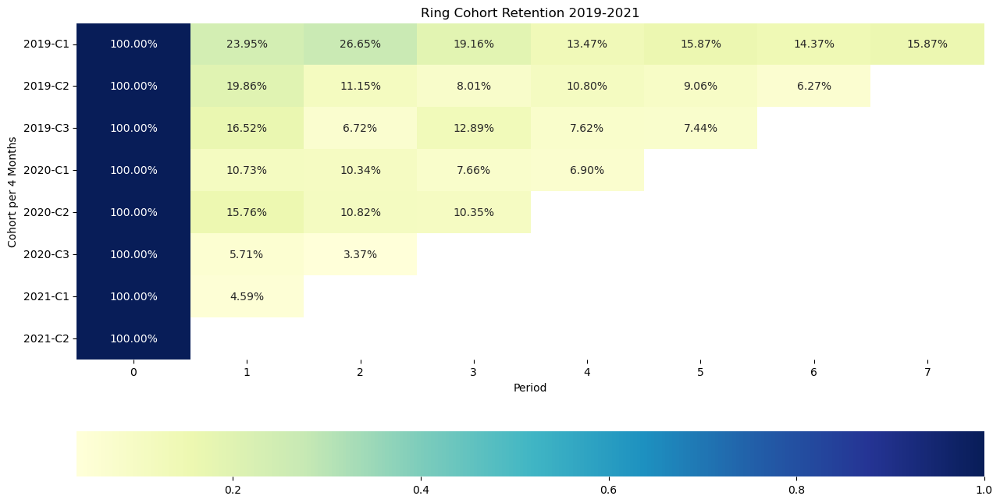

In [187]:
# Cohort Retention Visualization
plt.figure(figsize=(15,8))
sns.heatmap(data=cohort_retention_final_ring,annot=True,fmt='.2%'
            ,cbar_kws={'orientation':'horizontal'},cmap='YlGnBu')
plt.title('Ring Cohort Retention 2019-2021')
plt.xlabel('Period')
plt.ylabel('Cohort per 4 Months')
plt.show()

In [188]:
cohort_retention_pivot_ring.to_csv("Final Look Cohort Retention Pivot Ring.csv", index=False)

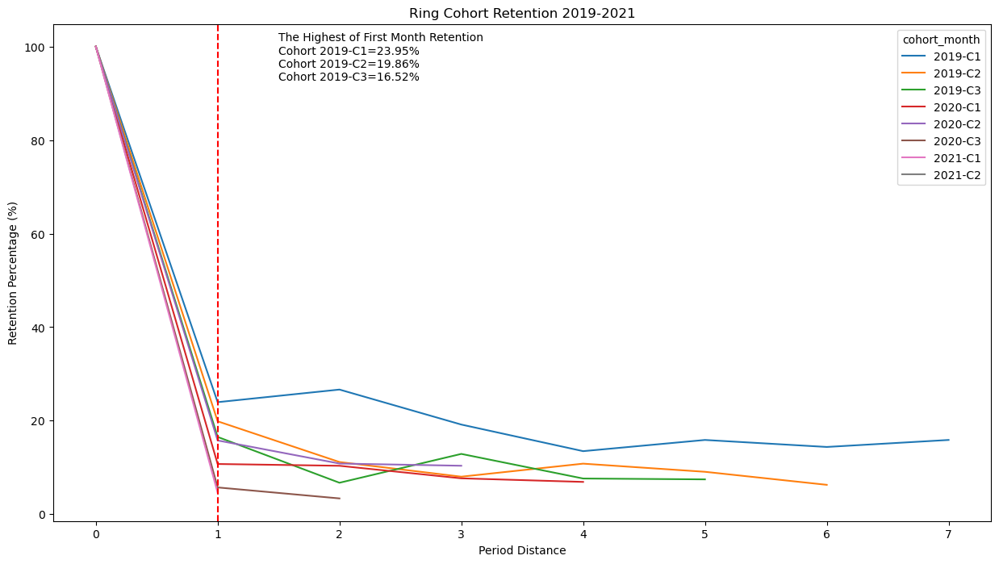

In [189]:
#Create lineplot
plt.figure(figsize=(15,8))

#Cohort lineplot
sns.lineplot(data=cohort_retention_ring,x='period_distance',y='percentage',hue='cohort_month')

#Vertical line
plt.axvline(x=1,linestyle='--',color='red')

#Anotasi
top_3=cohort_retention_ring[cohort_retention_ring['period_distance']==1].sort_values(by='percentage',ascending=False).head()
top_3_name=top_3['cohort_month'].to_list()
top_3_percentage=top_3['percentage'].to_list()

#String anotasi
text=f'''
The Highest of First Month Retention
Cohort {top_3_name[0]}={0.01*top_3_percentage[0]:.2%}
Cohort {top_3_name[1]}={0.01*top_3_percentage[1]:.2%}
Cohort {top_3_name[2]}={0.01*top_3_percentage[2]:.2%}
'''

plt.text(1.5,90,text)

plt.xlabel('Period Distance')
plt.ylabel('Retention Percentage (%)')
plt.title('Ring Cohort Retention 2019-2021')
plt.show()

`Jewelry.pendant`

In [190]:
jewelry_pendant_data = df[df['Category_alias'] == 'jewelry.pendant']
jewelry_pendant_data

,Order_datetime,User_ID,Category_alias
2,2018-12-02 13:53:42+00:00,1.515916e+18,jewelry.pendant
3,2018-12-02 17:44:02+00:00,1.515916e+18,jewelry.pendant
8,2018-12-03 07:03:49+00:00,1.515916e+18,jewelry.pendant
20,2018-12-04 20:10:22+00:00,1.515916e+18,jewelry.pendant
24,2018-12-05 08:40:12+00:00,1.515916e+18,jewelry.pendant
...,...,...,...
95855,2021-12-01 08:03:34+00:00,1.515916e+18,jewelry.pendant
95858,2021-12-01 08:14:17+00:00,1.515916e+18,jewelry.pendant
95868,2021-12-01 08:27:21+00:00,1.515916e+18,jewelry.pendant
95897,2021-12-01 09:15:46+00:00,1.515916e+18,jewelry.pendant


In [191]:
#Define cohort
jewelry_pendant_data['cohort_month']=jewelry_pendant_data.groupby('User_ID')['Order_datetime'].transform('min').dt.to_period('M')

jewelry_pendant_data['current_transaction_month']=jewelry_pendant_data['Order_datetime'].dt.to_period('M')  
jewelry_pendant_data=jewelry_pendant_data[['User_ID','cohort_month','current_transaction_month']]
jewelry_pendant_data

,User_ID,cohort_month,current_transaction_month
2,1.515916e+18,2018-12,2018-12
3,1.515916e+18,2018-12,2018-12
8,1.515916e+18,2018-12,2018-12
20,1.515916e+18,2018-12,2018-12
24,1.515916e+18,2018-12,2018-12
...,...,...,...
95855,1.515916e+18,2021-12,2021-12
95858,1.515916e+18,2021-11,2021-12
95868,1.515916e+18,2021-12,2021-12
95897,1.515916e+18,2021-12,2021-12


In [192]:
exclude_periods = [pd.Period('2021-12'), 
    pd.Period('2021-11'), 
    pd.Period('2021-10'), 
    pd.Period('2021-09'), 
    pd.Period('2018-12')]
jewelry_pendant_data = jewelry_pendant_data[~jewelry_pendant_data['cohort_month'].isin(exclude_periods)]
jewelry_pendant_data

,User_ID,cohort_month,current_transaction_month
129,1.515916e+18,2019-01,2019-01
133,1.515916e+18,2019-01,2019-01
134,1.550613e+18,2019-01,2019-01
148,1.515916e+18,2019-01,2019-01
158,1.515916e+18,2019-01,2019-01
...,...,...,...
95453,1.515916e+18,2019-03,2021-11
95454,1.515916e+18,2019-03,2021-11
95525,1.515916e+18,2021-06,2021-11
95551,1.515916e+18,2021-04,2021-11


In [193]:
exclude_periods = [pd.Period('2021-12'), 
    pd.Period('2021-11'), 
    pd.Period('2021-10'), 
    pd.Period('2021-09'), 
    pd.Period('2018-12')]
jewelry_pendant_data = jewelry_pendant_data[~jewelry_pendant_data['current_transaction_month'].isin(exclude_periods)]
jewelry_pendant_data

,User_ID,cohort_month,current_transaction_month
129,1.515916e+18,2019-01,2019-01
133,1.515916e+18,2019-01,2019-01
134,1.550613e+18,2019-01,2019-01
148,1.515916e+18,2019-01,2019-01
158,1.515916e+18,2019-01,2019-01
...,...,...,...
75300,1.515916e+18,2021-08,2021-08
75312,1.515916e+18,2021-08,2021-08
75323,1.515916e+18,2021-08,2021-08
75326,1.515916e+18,2021-08,2021-08


In [194]:
# Ensure columns are strings (optional, but safe)
jewelry_pendant_data['cohort_month'] = jewelry_pendant_data['cohort_month'].astype(str)
jewelry_pendant_data['current_transaction_month'] = jewelry_pendant_data['current_transaction_month'].astype(str)

def jewelry_pendant_data4month(date_str):
    # Split into year and month (e.g., "2019-01" → ["2019", "01"])
    parts = date_str.split('-')
    if len(parts) != 2:  # Skip malformed entries
        return date_str
    
    year, month = parts
    
    # Compare month as a string without converting to integer
    if month in {'01', '02', '03', '04'}:
        return f"{year}-C1"
    elif month in {'05', '06', '07', '08'}:
        return f"{year}-C2"
    elif month in {'09', '10', '11', '12'}:
        return f"{year}-C3"
    else:
        return date_str  # Fallback for unexpected values

# Apply the function
# Convert User_ID from scientific notation to full integer string
jewelry_pendant_data['User_ID'] = jewelry_pendant_data['User_ID'].apply(lambda x: f"{int(x):.0f}")
jewelry_pendant_data['cohort_month'] = jewelry_pendant_data['cohort_month'].apply(convert_to_4month_period)
jewelry_pendant_data['current_transaction_month'] = jewelry_pendant_data['current_transaction_month'].apply(convert_to_4month_period)
jewelry_pendant_data = jewelry_pendant_data.drop_duplicates()
jewelry_pendant_data

,User_ID,cohort_month,current_transaction_month
129,1515915625192894720,2019-C1,2019-C1
133,1515915625156212224,2019-C1,2019-C1
134,1550612949079425536,2019-C1,2019-C1
148,1515915625248999168,2019-C1,2019-C1
158,1515915625195597312,2019-C1,2019-C1
...,...,...,...
75300,1515915625622176000,2021-C2,2021-C2
75312,1515915625563618560,2021-C2,2021-C2
75323,1515915625675153664,2021-C2,2021-C2
75326,1515915625622349056,2021-C2,2021-C2


In [195]:
# Step 3 : Agregasi (count)
cohort_retention_pendant=jewelry_pendant_data.groupby(['cohort_month','current_transaction_month'])['User_ID'].count().reset_index().rename(columns={'User_ID':'count_user'})
cohort_retention_pendant

,cohort_month,current_transaction_month,count_user
0,2019-C1,2019-C1,192
1,2019-C1,2019-C2,31
2,2019-C1,2019-C3,45
3,2019-C1,2020-C1,39
4,2019-C1,2020-C2,25
5,2019-C1,2020-C3,25
6,2019-C1,2021-C1,20
7,2019-C1,2021-C2,26
8,2019-C2,2019-C2,191
9,2019-C2,2019-C3,35


In [196]:
#Step 4 : Define period distance 
def calculate_period_distance_pendant(row):
    # Split cohort and current periods into year and quarter
    cohort_year, cohort_q = row['cohort_month'].split('-')
    current_year, current_q = row['current_transaction_month'].split('-')
    
    # Convert to numerical values (e.g., "C1" -> 1, "C2" -> 2, "C3" -> 3)
    cohort_num = int(cohort_q[1])  # Extract the number after "C"
    current_num = int(current_q[1])
    
    # Calculate total periods difference
    return (int(current_year) - int(cohort_year)) * 3 + (current_num - cohort_num)

# Apply the function to calculate period distance
cohort_retention_pendant['period_distance'] = cohort_retention_pendant.apply(calculate_period_distance, axis=1)
cohort_retention_pendant

,cohort_month,current_transaction_month,count_user,period_distance
0,2019-C1,2019-C1,192,0
1,2019-C1,2019-C2,31,1
2,2019-C1,2019-C3,45,2
3,2019-C1,2020-C1,39,3
4,2019-C1,2020-C2,25,4
5,2019-C1,2020-C3,25,5
6,2019-C1,2021-C1,20,6
7,2019-C1,2021-C2,26,7
8,2019-C2,2019-C2,191,0
9,2019-C2,2019-C3,35,1


In [197]:
cohort_total_pendant = cohort_retention_pendant[cohort_retention_pendant['period_distance'] == 0][['cohort_month','count_user']]
cohort_total_pendant.rename(columns={'count_user': 'total_user'}, inplace=True)
cohort_retention_pendant = pd.merge(cohort_retention_pendant, cohort_total_pendant, on='cohort_month',how='left')
cohort_retention_pendant['percentage'] = (cohort_retention_pendant['count_user']/ cohort_retention_pendant['total_user'])*100
cohort_retention_pendant

,cohort_month,current_transaction_month,count_user,period_distance,total_user,percentage
0,2019-C1,2019-C1,192,0,192,100.000000
1,2019-C1,2019-C2,31,1,192,16.145833
2,2019-C1,2019-C3,45,2,192,23.437500
3,2019-C1,2020-C1,39,3,192,20.312500
4,2019-C1,2020-C2,25,4,192,13.020833
5,2019-C1,2020-C3,25,5,192,13.020833
6,2019-C1,2021-C1,20,6,192,10.416667
7,2019-C1,2021-C2,26,7,192,13.541667
8,2019-C2,2019-C2,191,0,191,100.000000
9,2019-C2,2019-C3,35,1,191,18.324607


In [198]:
cohort_retention_pendant.to_csv("Final Look Cohort Retention Pendant.csv", index=False)

In [199]:
# Step 5 : Pivot tabel
cohort_retention_pivot_pendant=cohort_retention_pendant.pivot_table(index='cohort_month',columns='period_distance',values='count_user')
cohort_retention_pivot_pendant

period_distance,0,1,2,3,4,5,6,7
cohort_month,,,,,,,,
2019-C1,192.0,31.0,45.0,39.0,25.0,25.0,20.0,26.0
2019-C2,191.0,35.0,26.0,15.0,21.0,10.0,11.0,NaN
2019-C3,372.0,61.0,19.0,36.0,16.0,22.0,NaN,NaN
2020-C1,404.0,24.0,33.0,19.0,21.0,NaN,NaN,NaN
2020-C2,340.0,36.0,25.0,20.0,NaN,NaN,NaN,NaN
2020-C3,1229.0,54.0,31.0,NaN,NaN,NaN,NaN,NaN
2021-C1,1571.0,71.0,NaN,NaN,NaN,NaN,NaN,NaN
2021-C2,1601.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [200]:
# Step 6 : Convert to percentage
cohort_retention_final_pendant=cohort_retention_pivot_pendant.divide(cohort_retention_pivot_pendant.iloc[:,0],axis=0)
cohort_retention_final_pendant

period_distance,0,1,2,3,4,5,6,7
cohort_month,,,,,,,,
2019-C1,1.0,0.161458,0.234375,0.203125,0.130208,0.130208,0.104167,0.135417
2019-C2,1.0,0.183246,0.136126,0.078534,0.109948,0.052356,0.057592,NaN
2019-C3,1.0,0.163978,0.051075,0.096774,0.043011,0.059140,NaN,NaN
2020-C1,1.0,0.059406,0.081683,0.047030,0.051980,NaN,NaN,NaN
2020-C2,1.0,0.105882,0.073529,0.058824,NaN,NaN,NaN,NaN
2020-C3,1.0,0.043938,0.025224,NaN,NaN,NaN,NaN,NaN
2021-C1,1.0,0.045194,NaN,NaN,NaN,NaN,NaN,NaN
2021-C2,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


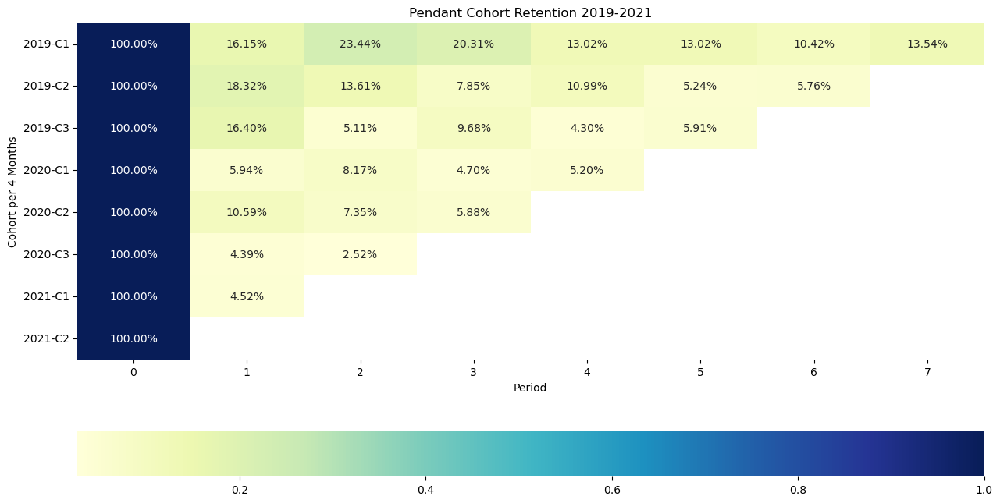

In [201]:
# Cohort Retention Visualization
plt.figure(figsize=(15,8))
sns.heatmap(data=cohort_retention_final_pendant,annot=True,fmt='.2%'
            ,cbar_kws={'orientation':'horizontal'},cmap='YlGnBu')
plt.title('Pendant Cohort Retention 2019-2021')
plt.xlabel('Period')
plt.ylabel('Cohort per 4 Months')
plt.show()

In [202]:
cohort_retention_pivot_pendant.to_csv("Final Look Cohort Retention Pivot Pendant.csv", index=False)

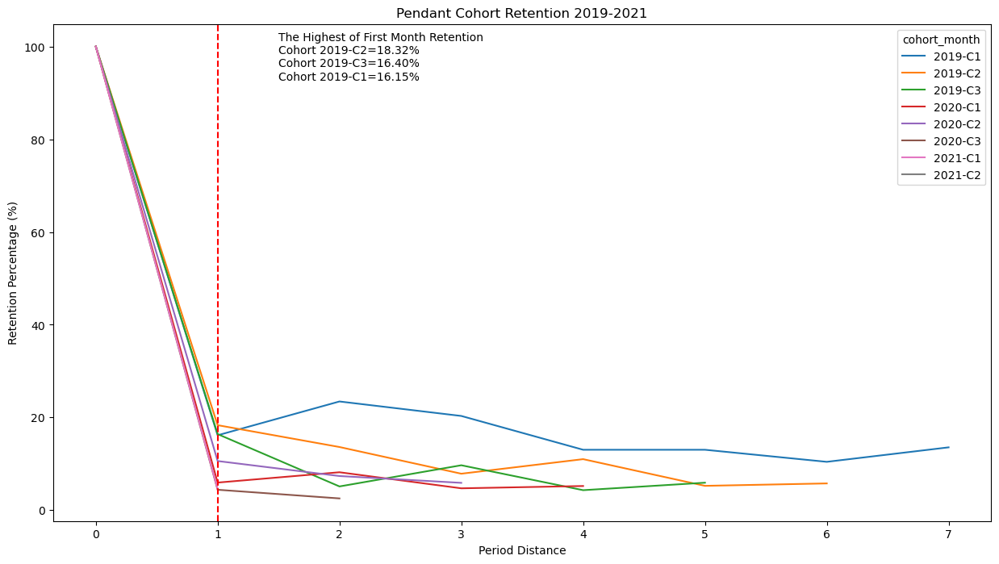

In [203]:
#Create lineplot
plt.figure(figsize=(15,8))

#Cohort lineplot
sns.lineplot(data=cohort_retention_pendant,x='period_distance',y='percentage',hue='cohort_month')

#Vertical line
plt.axvline(x=1,linestyle='--',color='red')

#Anotasi
top_3=cohort_retention_pendant[cohort_retention_pendant['period_distance']==1].sort_values(by='percentage',ascending=False).head()
top_3_name=top_3['cohort_month'].to_list()
top_3_percentage=top_3['percentage'].to_list()

#String anotasi
text=f'''
The Highest of First Month Retention
Cohort {top_3_name[0]}={0.01*top_3_percentage[0]:.2%}
Cohort {top_3_name[1]}={0.01*top_3_percentage[1]:.2%}
Cohort {top_3_name[2]}={0.01*top_3_percentage[2]:.2%}
'''

plt.text(1.5,90,text)

plt.xlabel('Period Distance')
plt.ylabel('Retention Percentage (%)')
plt.title('Pendant Cohort Retention 2019-2021')
plt.show()

In [204]:
df=pd.read_csv('jewelrywithheader.csv', parse_dates=['Order_datetime'])
df

,Order_datetime,Order_ID,Purchased_product_ID,Quantity_of_SKU_in_the_order,Category_ID,Category_alias,Brand_ID,Price_in_USD,User_ID,Product_gender_(for male/female),Color,Material,Gemstone
0,2018-12-01 11:40:29+00:00,1924719191579951782,1842195256808833386,1,1.806829e+18,jewelry.earring,0.000000e+00,561.51,1.515916e+18,NaN,red,gold,diamond
1,2018-12-01 17:38:31+00:00,1924899396621697920,1806829193678291446,1,1.806829e+18,NaN,NaN,212.14,1.515916e+18,NaN,yellow,gold,NaN
2,2018-12-02 13:53:42+00:00,1925511016616034733,1842214461889315556,1,1.806829e+18,jewelry.pendant,1.000000e+00,54.66,1.515916e+18,f,white,gold,sapphire
3,2018-12-02 17:44:02+00:00,1925626951238681511,1835566849434059453,1,1.806829e+18,jewelry.pendant,0.000000e+00,88.90,1.515916e+18,f,red,gold,diamond
4,2018-12-02 21:30:19+00:00,1925740842841014667,1873936840742928865,1,1.806829e+18,jewelry.necklace,0.000000e+00,417.67,1.515916e+18,NaN,red,gold,amethyst
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95906,2021-12-01 09:47:37+00:00,2719016587653808559,1515966223597820877,1,NaN,0.00,1.515916e+18,NaN,NaN,NaN,NaN,NaN,NaN
95907,2021-12-01 09:50:37+00:00,2719018098886705639,1956663830729720074,1,1.806829e+18,NaN,0.000000e+00,229.99,1.515916e+18,NaN,red,gold,NaN
95908,2021-12-01 09:52:06+00:00,2719018846999544322,1956663848219968336,1,1.806829e+18,jewelry.earring,1.000000e+00,630.00,1.515916e+18,f,white,gold,diamond
95909,2021-12-01 09:55:35+00:00,2719020596963836492,1835566854106513435,1,1.806829e+18,jewelry.earring,0.000000e+00,83.42,1.515916e+18,NaN,white,gold,fianit


In [205]:
df['User_ID'].nunique()

30915

In [206]:
repeat=pd.DataFrame(df['User_ID'].value_counts())
repeat

,count
User_ID,
1.515916e+18,1068
1.515916e+18,696
1.515916e+18,540
1.515916e+18,509
1.515916e+18,480
...,...
1.515916e+18,1
1.515916e+18,1
1.515916e+18,1


In [207]:
#Filter User_ID dengan count > 1
repeat_gt1 = repeat[repeat['count'] > 1]

In [208]:
#Tampilkan hasil
print(f"Jumlah User_ID dengan transaksi > 1: {len(repeat_gt1)}")
repeat_gt1

Jumlah User_ID dengan transaksi > 1: 12246


,count
User_ID,
1.515916e+18,1068
1.515916e+18,696
1.515916e+18,540
1.515916e+18,509
1.515916e+18,480
...,...
1.515916e+18,2
1.515916e+18,2
1.515916e+18,2


In [209]:
Persentase_Customer_repeat_order = (len(repeat_gt1) / len(repeat)) * 100
Persentase_Customer_repeat_order

39.61183891314896

## THANK YOU